<a href="https://colab.research.google.com/github/AguaClara/aide_design_specs/blob/validation/validation/Hydrodoser_Design.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install aguaclara

# Introduction

The goal of this Python tutorial is to explain how the Hydrodoser or Chemical Dose Controller (CDC) for an AguaClara plant is designed. For reference, this is a picture of a CDC:

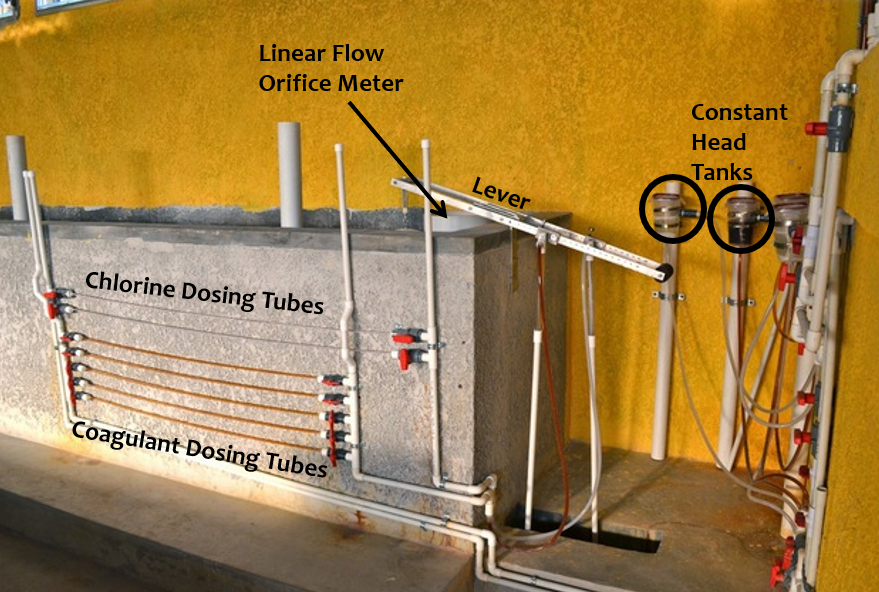

And this is a Hydrodoser:

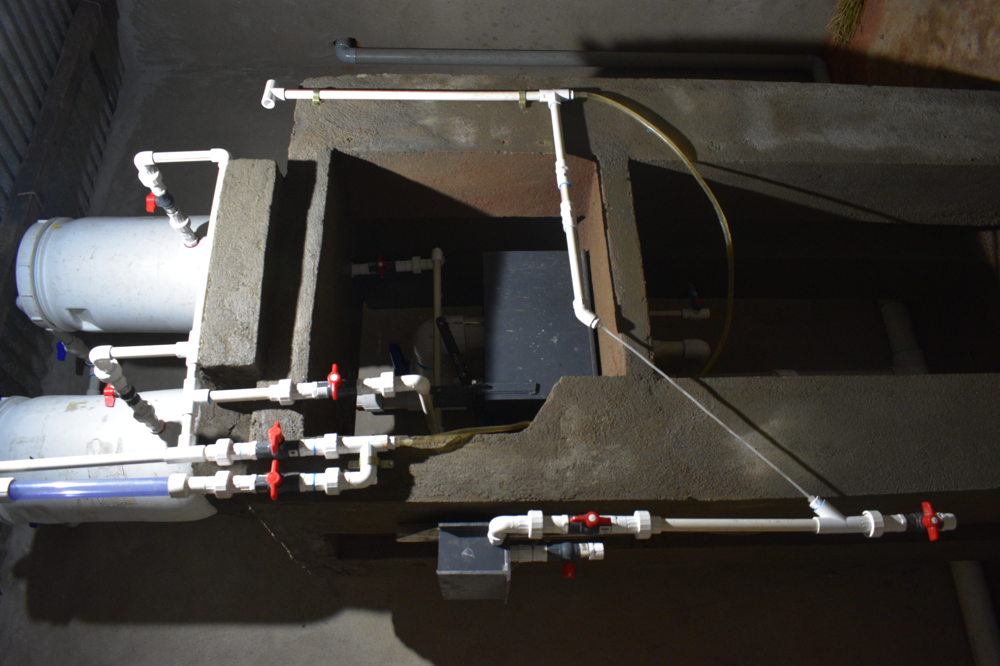

## Imports


In [34]:
# import core aguaclara pkg functions
import aguaclara.core.constants as con
import aguaclara.core.physchem as pc
import aguaclara.core.materials as mat
from aguaclara.design.cdc import CDC
from aguaclara.core.units import u

# import numpy for arrays
import numpy as np

# CDC Design Algorithm
Taken from [Monroe's CEE 4520 lectures](https://github.com/monroews/CEE4520Lectures/blob/master/Flow%20Control%20and%20Measurement.pptx) and
[aguaclara Python package](https://github.com/AguaClara/aguaclara/blob/master/aguaclara/design/cdc.py):

1. Calculate the maximum flow rate through each available dosing tube diameter that keeps error due to minor losses below 10%.
2. Calculate the total chemical flow rate that would be required by the treatment system for the maximum chemical dose and the maximum allowable stock concentration.
3. Calculate the number of dosing tubes required if the tubes flow at maximum capacity (round up).
4. Calculate the length of dosing tube(s) that correspond to each available tube diameter.
5. Select the longest dosing tube that is shorter than the maximum tube length allowable based on geometric constraints.
6. Select the dosing tube diameter and flow rate corresponding to the selected tube length.



In [40]:
# flow rate per tube
def q_max_tube(diameter, hl, pi_error, tube_k):
  return (np.pi * diameter ** 2 / 4) * np.sqrt(2 * hl * con.GRAVITY * pi_error / tube_k)

# These will likely be Expert Inputs in FeatureScript/Onshape
# max tube length
L_max = 2.0 * u.m
# chlorine and coagulant doses
chlor_dose_max = 2.0 * u.mg / u.L
chlor_dose_min = 0.2 * u.mg / u.L
chlor_dose_avg = 1.0 * u.mg / u.L
coag_dose_max = 40.0 * u.mg / u.L
# max stock concentrations
c_stock_max = 1.0 * u.g / u.L
# coag_stock_max = ??
# plant flow rate and temperature
q_plant_max = 2.5 * u.L / u.s
temp = u.Quantity(20,u.degC)

# calculate chemical flow rate using mass balance
def q_chem(q_plant, c_stock, dose):
  return q_plant * dose / c_stock

q_chem_max = q_chem(q_plant_max, c_stock_max, dose_max).to(u.mL / u.s)
q_chem_max


5.000000000000001 milliliter/second

In [28]:
# These will likely be Expert Inputs in FeatureScript/Onshape
# save an array of tube inner diameters to iterate through
inner_diameters = [0.125, 0.25, 0.375] * u.inch
# head loss
hl_tube = 20 * u.cm
# estimated minor loss coefficient of CDC tube and error ratio
k_cdc_tube = 2
error_ratio = 0.1

# calculate number of tubes required
n_tubes = np.ceil((q_chem_max / q_max_tube(inner_diameters, hl_tube, error_ratio, k_cdc_tube)).to_base_units())

In [47]:
# TODO: Calculate stock_nu based on temperature as is done in aguaclara package
def tube_l(diameter, hl, q_chem, q_tube_op, tube_k, stock_nu):
   return ((
        hl * con.GRAVITY * np.pi * diameter ** 4 /
        (128 * stock_nu * q_tube_op)
    ) - (8 * q_tube_op * tube_k /
        (128 * np.pi * stock_nu)
    )).to_base_units()

# viscosity of chlorinated water is similar enough to pure water this works,
# NOT the case for coagulant: see the TODO above
nu = pc.viscosity_kinematic_water(temp)

# calculate actual flow per tube
q_per_tube = q_chem_max / n_tubes

# calculate length of tubes
L_tube = tube_l(inner_diameters, hl_tube, q_chem_max, q_per_tube, k_cdc_tube, nu)

# select the length just below the max, and save the corresponding index
# to get the diameter and flow rate
L_tube_selected = L_tube[L_tube < L_max].max()
i = L_tube.tolist().index(L_tube_selected)
diameter_selected = inner_diameters[i]
n_tubes_selected = n_tubes[i]

In [48]:
# check that the Reynold's number is laminar
assert pc.re_pipe(q_per_tube[0], inner_diameters[0], nu) < 2100
# print flow to ensure it's close to q_chem_max
q_actual = pc.flow_pipe(diameter_selected, hl_tube, L_tube_selected, nu, Roughness=mat.PVC_PIPE_ROUGH, KMinor=k_cdc_tube).to(u.mL/u.s) * n_tubes_selected
q_actual

5.000690290666773 milliliter/second

# References
- [Monroe's CEE 4520 Flow and Measurement Lecture](https://github.com/monroews/CEE4520Lectures/blob/master/Flow%20Control%20and%20Measurement.pptx)
- [AguaClara Textbook](https://github.com/AguaClara/Textbook)
- [Hydrodoser Mathcad Design file](https://drive.google.com/file/d/13_7ZivCRuQdNW0kh_Us8JDQ007XGEFOP/view?usp=sharing)
- [aguaclara.design.cdc](https://github.com/AguaClara/aguaclara/blob/master/aguaclara/design/cdc.py)